## Creating a race graph 

This notebook contains the process of creating a race graph in additon the exploring the bariatric dataset. That dataset turned out to be of no value so the total incident was plotted as a race graph.

This https://github.com/pratapvardhan/notebooks/blob/master/barchart-race-matplotlib.ipynb tutorial is the foundation of this race graph plot.

### Analyse the bariatric indicents dataset

In [245]:
# Import necessary libraries and apply settings
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
from IPython.display import Image
%matplotlib inline

In [246]:
# read in data 
file = 'Bariatric_incidents_LFB_from_Jan_2009.csv'
df = pd.read_csv(file, encoding='iso-8859-1')
# parse_dates = [['DateOfCall', 'TimeOfCall']],
# df = pd.read_csv(file,encoding='iso-8859-1',index_col = None,keep_date_col = True,infer_datetime_format = True)
df.DateTimeOfCall = pd.to_datetime(df.DateTimeOfCall)

In [247]:
df.head()

,IncidentNumber,DateTimeOfCall,CalYear,FinYear,TypeOfIncident,PumpCount,PumpHoursTotal,HourlyNominalCost(£),IncidentNominalCost(£),PropertyType,...,IsBariatric,SpecialServiceTypeCategory,SpecialServiceType,FinalDescription,WardCode,WardName,BoroughCode,BoroughName,StnGroundName,Postcode
0,5069091,2009-08-01 11:27:00,2009,2008/09,Special Service,1.0,1.0,255,255.0,Other road vehicle,...,1,Other Transport incident,Transport incident (not RTC) - Release of pers...,ASSIST LAS WITH HEAVY PATIENT STUCK IN AMBULA...,E05000490,Plaistow South,E09000025,Newham,Plaistow,E13
1,11630091,2009-01-19 17:39:00,2009,2008/09,Special Service,1.0,1.0,255,255.0,Purpose Built Flats/Maisonettes - Up to 3 stor...,...,1,Assist other agencies,Other assistance to police/ambulance,ASSIST AMBULANCE IN REMOVING PATIENT WITH CARD...,E05009396,Golborne,E09000020,Kensington and Chelsea,North Kensington,W10
2,24914091,2009-12-02 15:09:00,2009,2008/09,Special Service,1.0,1.0,255,255.0,House - single occupancy,...,1,Assist other agencies,Other assistance to police/ambulance,"ASSIST LAS WITH DIFFICULT PATIENT REMOVAL, B2",E05000203,Jubilee,E09000010,Enfield,Edmonton,N9
3,28750091,2009-02-18 22:57:00,2009,2008/09,Special Service,1.0,1.0,255,255.0,Converted Flat/Maisonette - Up to 2 storeys,...,1,Assist other agencies,Other assistance to police/ambulance,"ASSIST AMBULANCE,B0",E05000275,Noel Park,E09000014,Haringey,Hornsey,N8
4,43952091,2009-03-17 12:08:00,2009,2008/09,Special Service,1.0,3.0,255,765.0,House - single occupancy,...,1,Assist other agencies,Other assistance to police/ambulance,"ASSIST LAS WITH REMOVAL OF PATIENT,B2,LO1",E05000305,West Harrow,E09000015,Harrow,Harrow,HA1


In [248]:
# add datetime columns 
df['Year'] = df.DateTimeOfCall.dt.year
df['Month'] = df.DateTimeOfCall.dt.month
df['Week'] = df.DateTimeOfCall.dt.week
df['Weekday'] = df.DateTimeOfCall.dt.weekday # 0 is monday, 6 is sunday

In [249]:
# nr of unique value for every column
print(df.nunique())

# lets check those that dont have to many unique values (<30), since the dataset is only, roughly 650 rows
df.nunique().index[df.nunique() < 30]

IncidentNumber                670
DateTimeOfCall                670
CalYear                        12
FinYear                        12
TypeOfIncident                  2
PumpCount                       4
PumpHoursTotal                  9
HourlyNominalCost(£)            9
IncidentNominalCost(£)         39
PropertyType                   46
PropertyCategory                8
IsBariatric                     1
SpecialServiceTypeCategory     12
SpecialServiceType             27
FinalDescription              467
WardCode                      378
WardName                      461
BoroughCode                    33
BoroughName                    65
StnGroundName                 102
Postcode                      198
Year                           12
Month                          12
Week                           53
Weekday                         7
dtype: int64


Index(['CalYear', 'FinYear', 'TypeOfIncident', 'PumpCount', 'PumpHoursTotal',
       'HourlyNominalCost(£)', 'PropertyCategory', 'IsBariatric',
       'SpecialServiceTypeCategory', 'SpecialServiceType', 'Year', 'Month',
       'Weekday'],
      dtype='object')

In [250]:
df.describe()

,CalYear,PumpCount,PumpHoursTotal,HourlyNominalCost(£),IncidentNominalCost(£),IsBariatric,Year,Month,Week,Weekday
count,670.000000,665.000000,665.000000,670.000000,665.000000,670.0,670.000000,670.000000,670.000000,670.000000
mean,2014.631343,1.049624,1.458647,299.323881,433.727820,1.0,2014.631343,6.538806,26.556716,3.067164
std,3.160846,0.249585,1.144074,30.810689,322.318506,0.0,3.160846,3.442131,15.009979,1.978199
min,2009.000000,1.000000,1.000000,255.000000,255.000000,1.0,2009.000000,1.000000,1.000000,0.000000
25%,2012.000000,1.000000,1.000000,260.000000,290.000000,1.0,2012.000000,4.000000,14.000000,2.000000
50%,2015.000000,1.000000,1.000000,295.000000,326.000000,1.0,2015.000000,7.000000,27.000000,3.000000
75%,2017.000000,1.000000,2.000000,328.000000,520.000000,1.0,2017.000000,9.000000,39.000000,5.000000
max,2020.000000,4.000000,19.000000,339.000000,4940.000000,1.0,2020.000000,12.000000,53.000000,6.000000


In [251]:
# check for nan values 
# df.SpecialServiceTypeCategory.dropna()

df.dropna(subset=["SpecialServiceTypeCategory"], inplace=True)
df.isnull().sum()

IncidentNumber                0
DateTimeOfCall                0
CalYear                       0
FinYear                       0
TypeOfIncident                0
PumpCount                     5
PumpHoursTotal                5
HourlyNominalCost(£)          0
IncidentNominalCost(£)        5
PropertyType                  0
PropertyCategory              0
IsBariatric                   0
SpecialServiceTypeCategory    0
SpecialServiceType            0
FinalDescription              0
WardCode                      3
WardName                      3
BoroughCode                   3
BoroughName                   3
StnGroundName                 0
Postcode                      0
Year                          0
Month                         0
Week                          0
Weekday                       0
dtype: int64

In [252]:
df["SpecialServiceTypeCategory"].value_counts()

Assist other agencies              511
Medical Incident                    72
Medical Incident - Co-responder     29
Other rescue/release of persons     18
No action (not false alarm)         11
Effecting entry/exit                10
Stand By                             9
Other Transport incident             3
Removal of objects from people       2
Advice Only                          2
Making Safe (not RTC)                1
Evacuation (no fire)                 1
Name: SpecialServiceTypeCategory, dtype: int64

In [253]:
df.DateTimeOfCall.dt.year.value_counts().sort_index()

2009    33
2010    58
2011    41
2012    57
2013    73
2014    64
2015    51
2016    78
2017    61
2018    48
2019    87
2020    18
Name: DateTimeOfCall, dtype: int64

<BarContainer object of 12 artists>

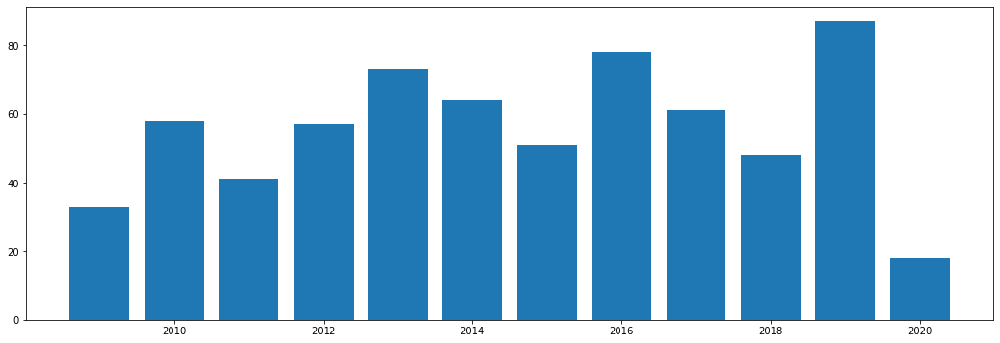

In [254]:
plt.figure(figsize=(18,6))
plt.bar(df.DateTimeOfCall.dt.year.value_counts().sort_index().index, 
        df.DateTimeOfCall.dt.year.value_counts().sort_index())

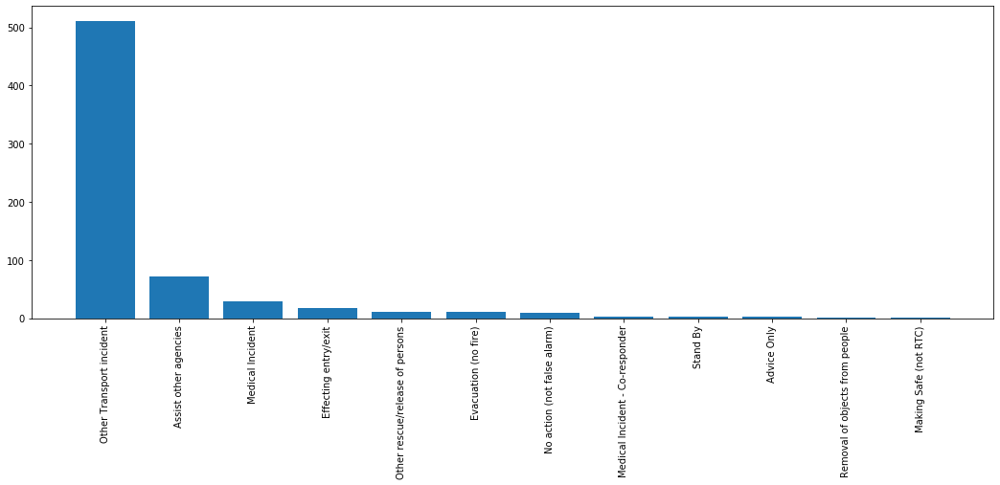

In [255]:
plt.figure(figsize=(18,6))
plt.bar(df.SpecialServiceTypeCategory.unique(),df["SpecialServiceTypeCategory"].value_counts())
plt.xticks(rotation=90);

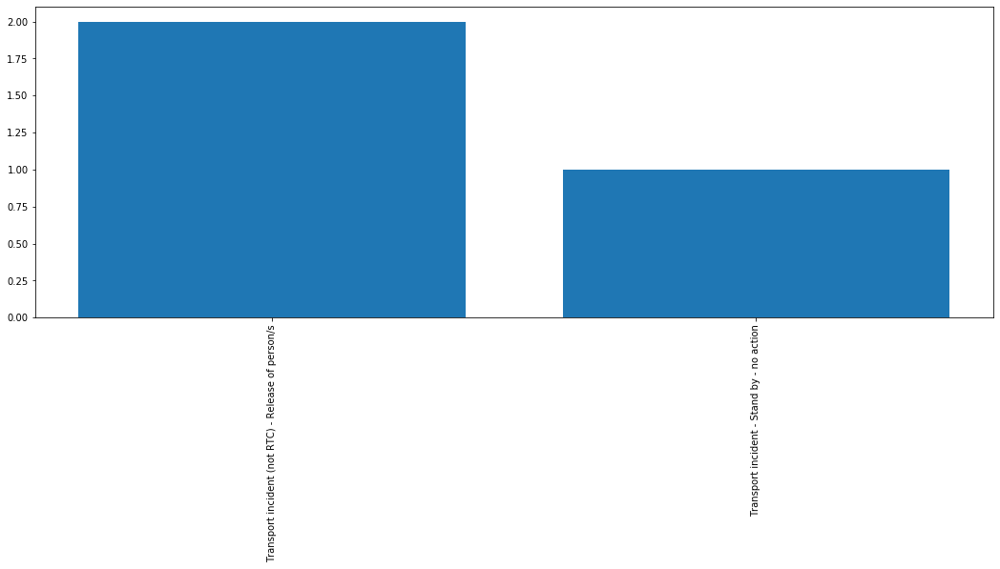

In [256]:
# Lets have closer look into the most frequent category of "Other Transport incident"
df_temp = df[df["SpecialServiceTypeCategory"] == "Other Transport incident"]
plt.figure(figsize=(18,6))
plt.bar(df_temp.SpecialServiceType.unique(),df_temp["SpecialServiceType"].value_counts())
plt.xticks(rotation=90);

In [257]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML

In [258]:
# lets look at the count of each category (SpecialServiceTypeCategory) over the months

In [259]:
len(df.SpecialServiceTypeCategory.unique())

12

In [260]:
# create new column year-month
df["YearM"] = df['DateTimeOfCall'].dt.strftime('%Y-%m')

In [261]:
df.head()

,IncidentNumber,DateTimeOfCall,CalYear,FinYear,TypeOfIncident,PumpCount,PumpHoursTotal,HourlyNominalCost(£),IncidentNominalCost(£),PropertyType,...,WardName,BoroughCode,BoroughName,StnGroundName,Postcode,Year,Month,Week,Weekday,YearM
0,5069091,2009-08-01 11:27:00,2009,2008/09,Special Service,1.0,1.0,255,255.0,Other road vehicle,...,Plaistow South,E09000025,Newham,Plaistow,E13,2009,8,31,5,2009-08
1,11630091,2009-01-19 17:39:00,2009,2008/09,Special Service,1.0,1.0,255,255.0,Purpose Built Flats/Maisonettes - Up to 3 stor...,...,Golborne,E09000020,Kensington and Chelsea,North Kensington,W10,2009,1,4,0,2009-01
2,24914091,2009-12-02 15:09:00,2009,2008/09,Special Service,1.0,1.0,255,255.0,House - single occupancy,...,Jubilee,E09000010,Enfield,Edmonton,N9,2009,12,49,2,2009-12
3,28750091,2009-02-18 22:57:00,2009,2008/09,Special Service,1.0,1.0,255,255.0,Converted Flat/Maisonette - Up to 2 storeys,...,Noel Park,E09000014,Haringey,Hornsey,N8,2009,2,8,2,2009-02
4,43952091,2009-03-17 12:08:00,2009,2008/09,Special Service,1.0,3.0,255,765.0,House - single occupancy,...,West Harrow,E09000015,Harrow,Harrow,HA1,2009,3,12,1,2009-03


In [262]:
df_count = df.groupby(["SpecialServiceTypeCategory","YearM"]).size().unstack(level=0,fill_value=0).unstack().reset_index(name="value")
df_count = df_count.rename(columns={'SpecialServiceTypeCategory': 'name'})
df_count.head()

,name,YearM,value
0,Advice Only,2009-01,0
1,Advice Only,2009-02,0
2,Advice Only,2009-03,0
3,Advice Only,2009-04,0
4,Advice Only,2009-05,0


In [263]:
# aggregate cumsum data to yearly-month count
df_count = df.groupby(["SpecialServiceTypeCategory","YearM"]).size().unstack(level=0,fill_value=0).unstack().reset_index(name='value')
df_count = df_count.rename(columns={'SpecialServiceTypeCategory': 'name'})
df_count = df_count.sort_values(by="YearM")

df_count['Cumsum'] = df_count.groupby('name')["value"].cumsum()

# Do a cumsum to keep track of the total count along the years and months 
df_count.head(10)



,name,YearM,value,Cumsum
0,Advice Only,2009-01,0,0
1224,Other rescue/release of persons,2009-01,0,0
272,Effecting entry/exit,2009-01,0,0
1088,Other Transport incident,2009-01,0,0
408,Evacuation (no fire),2009-01,0,0
136,Assist other agencies,2009-01,2,2
1360,Removal of objects from people,2009-01,0,0
952,No action (not false alarm),2009-01,0,0
544,Making Safe (not RTC),2009-01,0,0
816,Medical Incident - Co-responder,2009-01,0,0


In [264]:
# df_count = df[["SpecialServiceTypeCategory","Year","Month"]]

In [265]:
# df_temp.groupby(["Year","SpecialServiceTypeCategory"]).size().to_frame(name = 'value').unstack(level=-1,fill_value = 0).unstakc()

# .unstack(level=0,fill_value=0).reset_index()
# testing = (df_temp[['Year']].gt(0)).groupby([df_temp['Year'],df_temp['Month'],df_temp['SpecialServiceTypeCategory']]).size().to_frame('Count').reset_index()
# testing


In [266]:
# df_temp.groupby(["Month","Year","SpecialServiceTypeCategory"])["Year"].agg("count").reset_index()
# count = df_temp.groupby(["Year","SpecialServiceTypeCategory","Month"]).size().reset_index()
# counting = pd.DataFrame({'Count' : count}).fillna(0)

# create new dataframe that has column as the count
# df_test = df.groupby(["SpecialServiceTypeCategory","Year"]).size().reset_index(name='counts') # this works too
# df_temp_count = df_temp.groupby( [ "Year", "SpecialServiceTypeCategory"] ).size().to_frame(name = 'value').reset_index()

In [267]:
df_count.head()

,name,YearM,value,Cumsum
0,Advice Only,2009-01,0,0
1224,Other rescue/release of persons,2009-01,0,0
272,Effecting entry/exit,2009-01,0,0
1088,Other Transport incident,2009-01,0,0
408,Evacuation (no fire),2009-01,0,0


In [287]:
# select all category types
categories = ['Other Transport incident', 'Assist other agencies',
       'Medical Incident', 'Effecting entry/exit',
       'Other rescue/release of persons', 'Evacuation (no fire)',
       'No action (not false alarm)', 'Medical Incident - Co-responder',
       'Stand By', 'Advice Only', 'Removal of objects from people',
       'Making Safe (not RTC)']

# create 12 colors
colors_selection = ["#adb0ff", "#ffb3ff", "#90d595", "#e48381", "#aafbff", "#f7bb5f", 
          "#eafb50","#adb0ff", "#ffb3ff", "#90d595", "#e48381", "#aafbff", "#f7bb5f",]

colors = dict(zip(categories,colors_selection))

group_lk = df_count.set_index('name')['YearM'].to_dict()

In [288]:
group_lk

{'Advice Only': '2020-09',
 'Other rescue/release of persons': '2020-09',
 'Effecting entry/exit': '2020-09',
 'Other Transport incident': '2020-09',
 'Evacuation (no fire)': '2020-09',
 'Assist other agencies': '2020-09',
 'Removal of objects from people': '2020-09',
 'No action (not false alarm)': '2020-09',
 'Making Safe (not RTC)': '2020-09',
 'Medical Incident - Co-responder': '2020-09',
 'Medical Incident': '2020-09',
 'Stand By': '2020-09'}

In [270]:
current_year = '2009-02'
dff = df_count[df_count['YearM'].eq(current_year)].sort_values(by='value', ascending=False).head(10)
dff

,name,YearM,value,Cumsum
137,Assist other agencies,2009-02,2,4
953,No action (not false alarm),2009-02,0,0
545,Making Safe (not RTC),2009-02,0,0
273,Effecting entry/exit,2009-02,0,0
1089,Other Transport incident,2009-02,0,0
1361,Removal of objects from people,2009-02,0,0
1497,Stand By,2009-02,0,0
681,Medical Incident,2009-02,0,0
409,Evacuation (no fire),2009-02,0,0
1,Advice Only,2009-02,0,0


In [296]:
# fig, ax = plt.subplots(figsize=(15, 8))

def draw_barchart(current_year):
    dff = df_count[df_count['YearM'].eq(current_year)].sort_values(by='Cumsum', ascending=True).tail(10)
    ax.clear()
    ax.barh(dff['name'], dff['Cumsum'], color=[colors[x] for x in dff['name']])
    dx = dff['Cumsum'].max() / 200
    for i, (value, name) in enumerate(zip(dff['Cumsum'], dff['name'])):
        ax.text(value-dx, i,     name,           size=14, weight=600, ha='right', va='bottom')
        ax.text(value+dx, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')
    ax.text(1, 0.4, current_year, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.text(0, 1.06, 'Population (thousands)', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.15, 'Total incident types',
            transform=ax.transAxes, size=24, weight=600, ha='left', va='top')
    plt.box(False)
    
# draw_barchart('2009-10')

In [ ]:
# make range in correct format
years = range(2009,2021)
months = ['01','02','03','04','05','06','07','08','09','10','11','12']
frames = ['{}-{}'.format(x,y) for x in years for y in months]

fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart, frames=frames)
HTML(animator.to_jshtml())

In [ ]:
#Save html

years = range(2009,2021)
months = ['01','02','03','04','05','06','07','08','09','10','11','12']
frames = ['{}-{}'.format(x,y) for x in years for y in months]

fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart, frames=frames)
html = animator.to_jshtml()
with open('race_graph.html', 'w') as f:
    f.write(html)

## Exploring All Incident Data and creating a bigger race graph

In [348]:
incidents = pd.read_csv('fire_incidents_smaller.csv')
incidents = incidents.dropna(axis=0, subset=['AttendanceTimeSeconds'])

incidents = incidents[["IncGeo_BoroughCode","StopCodeDescription",'DateOfCall']]

# Convert datetime to date
incidents.DateOfCall = pd.to_datetime(incidents.DateOfCall)

# Add columns for month, week, weekday
# incidents['Month'] = incidents.DateOfCall.dt.month
# incidents['Week'] = incidents.DateOfCall.dt.week
# incidents['Weekday'] = incidents.DateOfCall.dt.weekday # 0 is monday, 6 is sunday

# convert dateofcall to date not datetime for later join
# incidents.DateOfCall = pd.to_datetime(incidents.DateOfCall).dt.date
incidents.head()

,IncGeo_BoroughCode,StopCodeDescription,DateOfCall
0,E09000021,AFA,2017-01-01
1,E09000020,Primary Fire,2017-01-01
2,E09000012,AFA,2017-01-01
3,E09000031,False alarm - Good intent,2017-01-01
4,E09000025,Secondary Fire,2017-01-01


In [349]:
import fiona
shapefile = 'Shapefiles/london_borough_shapefile_wgs84_test.shp'

shp = fiona.open(shapefile)
# Getting the features of the shapefile
borough_name = [feat["properties"]["NAME"] for feat in shp]
borough_code = [feat["properties"]["GSS_CODE"] for feat in shp]

In [350]:
naming = dict(zip(borough_code,borough_name))

In [351]:
incidents

,IncGeo_BoroughCode,StopCodeDescription,DateOfCall
0,E09000021,AFA,2017-01-01
1,E09000020,Primary Fire,2017-01-01
2,E09000012,AFA,2017-01-01
3,E09000031,False alarm - Good intent,2017-01-01
4,E09000025,Secondary Fire,2017-01-01
...,...,...,...
1219407,E09000018,Special Service,2012-12-31
1219409,E09000020,Special Service,2012-12-31
1219410,E09000030,AFA,2012-12-31
1219411,E09000028,AFA,2012-12-31


In [352]:
# create year-month column
incidents["YearM"] = incidents['DateOfCall'].dt.strftime('%Y-%m')
incidents.head()

,IncGeo_BoroughCode,StopCodeDescription,DateOfCall,YearM
0,E09000021,AFA,2017-01-01,2017-01
1,E09000020,Primary Fire,2017-01-01,2017-01
2,E09000012,AFA,2017-01-01,2017-01
3,E09000031,False alarm - Good intent,2017-01-01,2017-01
4,E09000025,Secondary Fire,2017-01-01,2017-01


In [353]:
incidents_count = incidents.groupby(["IncGeo_BoroughCode","StopCodeDescription",'YearM',]).count().reset_index()
incidents_count = incidents_count.rename(columns={'IncGeo_BoroughCode': 'name'})
# incidents_count = incidents_count.rename(columns={'StopCodeDescription': 'code'})
incidents_count = incidents_count.rename(columns={'DateOfCall': 'value'})
incidents_count = incidents_count.sort_values(by="YearM")

incidents_count['Cumsum'] = incidents_count.groupby(['name','StopCodeDescription'])["value"].cumsum()

incidents_count

,name,StopCodeDescription,YearM,value,Cumsum
16479,E09000021,False alarm - Malicious,2009-01,5,5
12815,E09000016,Special Service,2009-01,48,48
9992,E09000013,False alarm - Malicious,2009-01,3,3
21978,E09000028,False alarm - Good intent,2009-01,57,57
11860,E09000015,Secondary Fire,2009-01,9,9
...,...,...,...,...,...
13631,E09000017,Secondary Fire,2020-02,13,4448
6038,E09000008,False alarm - Malicious,2020-02,7,832
13765,E09000017,Special Service,2020-02,82,8245
6579,E09000009,AFA,2020-02,111,14452


In [354]:
incidents_count["name_combined"] = incidents_count.name + " - " + incidents_count.StopCodeDescription
incidents_count

,name,StopCodeDescription,YearM,value,Cumsum,name_combined
16479,E09000021,False alarm - Malicious,2009-01,5,5,E09000021 - False alarm - Malicious
12815,E09000016,Special Service,2009-01,48,48,E09000016 - Special Service
9992,E09000013,False alarm - Malicious,2009-01,3,3,E09000013 - False alarm - Malicious
21978,E09000028,False alarm - Good intent,2009-01,57,57,E09000028 - False alarm - Good intent
11860,E09000015,Secondary Fire,2009-01,9,9,E09000015 - Secondary Fire
...,...,...,...,...,...,...
13631,E09000017,Secondary Fire,2020-02,13,4448,E09000017 - Secondary Fire
6038,E09000008,False alarm - Malicious,2020-02,7,832,E09000008 - False alarm - Malicious
13765,E09000017,Special Service,2020-02,82,8245,E09000017 - Special Service
6579,E09000009,AFA,2020-02,111,14452,E09000009 - AFA


In [355]:
incidents_count.name

16479    E09000021
12815    E09000016
9992     E09000013
21978    E09000028
11860    E09000015
           ...    
13631    E09000017
6038     E09000008
13765    E09000017
6579     E09000009
26735    E09000033
Name: name, Length: 26736, dtype: object

<BarContainer object of 10 artists>

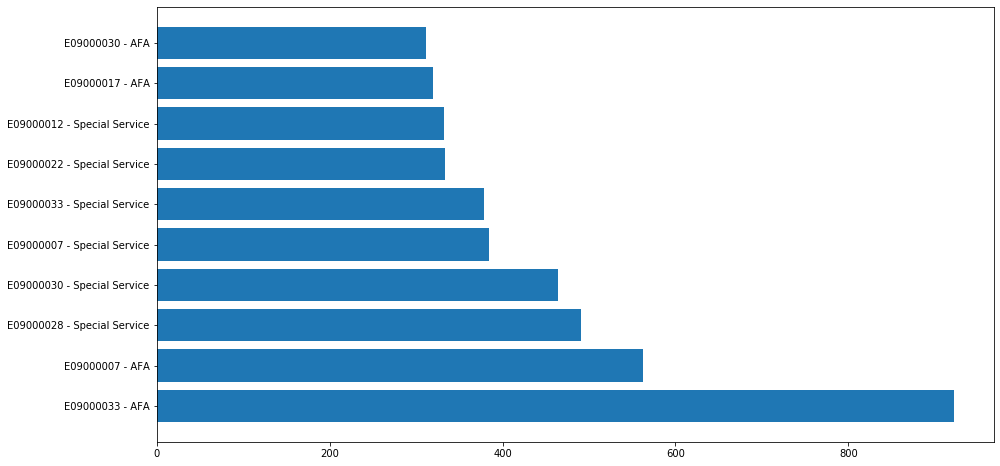

In [356]:
dff = incidents_count[incidents_count['YearM'].eq(current_year)].sort_values(by='Cumsum', ascending=False).head(10)
fig, ax = plt.subplots(figsize=(15, 8))
ax.barh(dff['name_combined'], dff['Cumsum'])

In [357]:
# create color dictionary
burough_name = list(incidents_count.name.unique())


colors = dict(zip(burough_name,
    ["#adb0ff", "#ffb3ff", "#90d595", "#e48381", "#aafbff", "#f7bb5f", "#eafb50", "#f7bg1f", "#eafdb8","#eafdb8",
    "#adb0ff", "#ffb3ff", "#90d595", "#e48381", "#aafbff", "#f7bb5f", "#eafb50", "#f7bg1f", "#eafdb8","#eafdb8",
    "#adb0ff", "#ffb3ff", "#90d595", "#e48381", "#aafbff", "#f7bb5f", "#eafb50", "#f7bg1f", "#eafdb8","#eafdb8",
    "#adb0ff", "#ffb3ff","#adb0ff"]
))

# group_lk = incidents_count.set_index('StopCodeDescription')['name'].to_dict()

In [334]:
colors["E09000007"]

'#adb0ff'

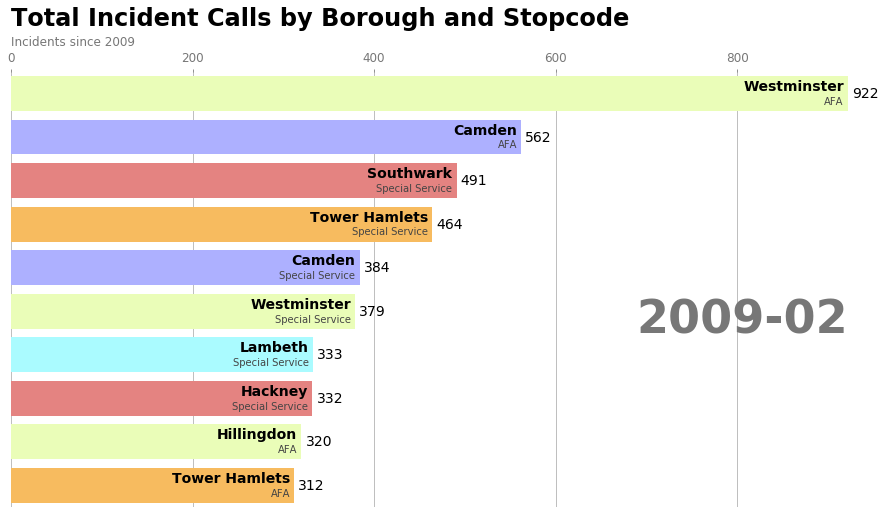

In [363]:
fig, ax = plt.subplots(figsize=(15, 8))

def draw_barchart_subgroup(current_year):
    dff = incidents_count[incidents_count['YearM'].eq(current_year)].sort_values(by='Cumsum', ascending=True).tail(10)
    ax.clear()
    ax.barh(dff['name_combined'], dff['Cumsum'], color=[colors[x] for x in dff['name']])
    dx = dff['Cumsum'].max() / 200
    for i, (value, name, code) in enumerate(zip(dff['Cumsum'], dff['name'], dff['StopCodeDescription'])):
        ax.text(value-dx, i,     naming[name],           size=14, weight=600, ha='right', va='bottom')
        ax.text(value-dx, i-.25, code, size=10, color='#444444', ha='right', va='baseline')
        ax.text(value+dx, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')
    ax.text(1, 0.4, current_year, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.text(0, 1.06, 'Incidents since 2009', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.15, 'Total Incident Calls by Borough and Stopcode',
            transform=ax.transAxes, size=24, weight=600, ha='left', va='top')
    plt.box(False)

draw_barchart_subgroup(current_year)

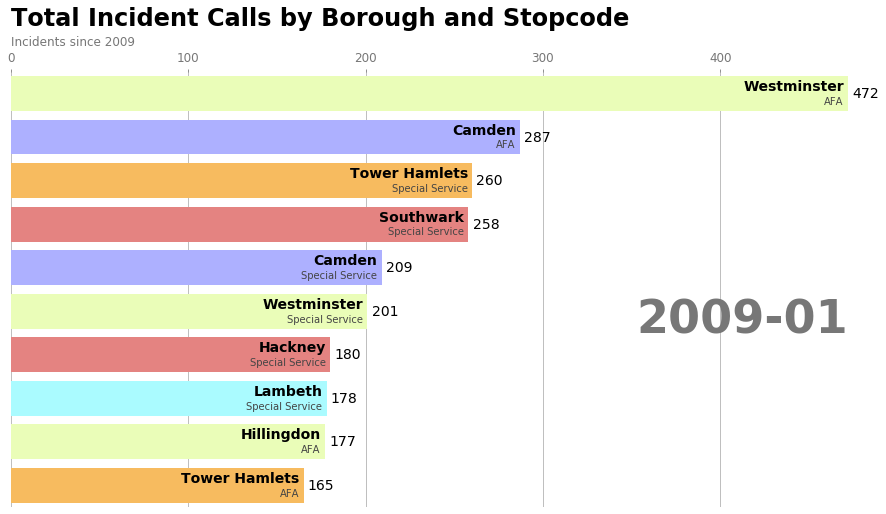

In [364]:
# make range in correct format
years = range(2009,2021)
months = ['01','02','03','04','05','06','07','08','09','10','11','12']
frames = ['{}-{}'.format(x,y) for x in years for y in months]

fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart_subgroup, frames=frames)
HTML(animator.to_jshtml())

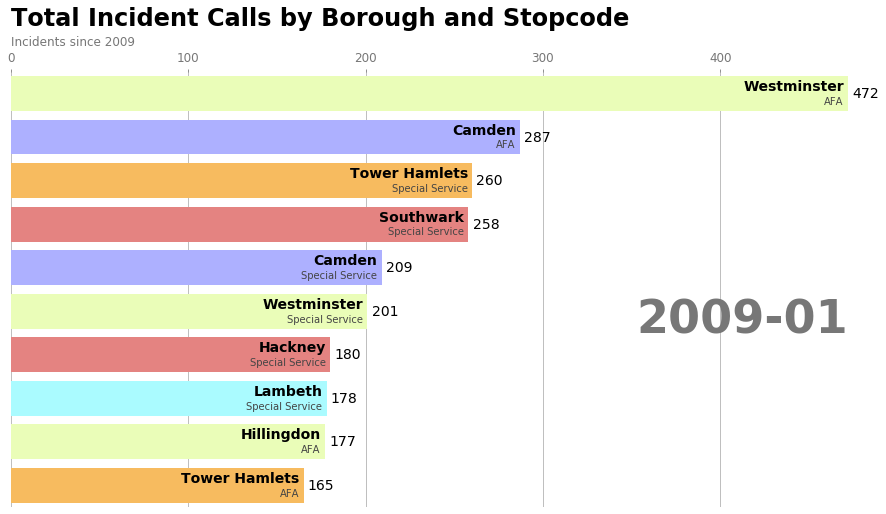

In [365]:
years = range(2009,2019)
months = ['01','02','03','04','05','06','07','08','09','10','11','12']
frames = ['{}-{}'.format(x,y) for x in years for y in months]

fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart_subgroup, frames=frames)
html = animator.to_jshtml()
with open('race_graph_borough.html', 'w') as f:
    f.write(html)

## Lets look at the housing data 

In [366]:
file = 'House_Ages/tables/E37000023.csv'
df = pd.read_csv(file, encoding='iso-8859-1')

In [369]:
df.head()

,lsoa11cd,lsoa11nm,BP_PRE_1900,BP_1900_1918,BP_1919_1929,BP_1930_1939,BP_1945_1954,BP_1955_1964,BP_1965_1972,BP_1973_1982,...,BP_2010_2015,BP_UNKNOWN,ALL_PROPERTIES,MODE1_VAL,MODE1_TYPE,MODE1_PC,MODE2_VAL,MODE2_TYPE,MODE2_PC,MODE2_MODE1_RATIO
0,E01000001,City of London 001A,60,1,0,0,0,50,840,10,...,0,10,1100,840,BP_1965_1972,0.76,80,BP_2000_2009,0.07,0.10
1,E01000002,City of London 001B,10,0,0,0,0,70,910,1,...,200,1,1190,910,BP_1965_1972,0.76,200,BP_2010_2015,0.17,0.22
2,E01000003,City of London 001C,20,0,0,0,0,20,780,1,...,0,1,910,780,BP_1965_1972,0.86,60,BP_1993_1999,0.07,0.08
3,E01000005,City of London 001E,90,1,1,20,1,140,110,170,...,70,1,680,170,BP_1973_1982,0.25,140,BP_1955_1964,0.21,0.82
4,E01000006,Barking and Dagenham 016A,40,20,170,140,30,0,0,0,...,1,0,530,170,BP_1919_1929,0.32,140,BP_1930_1939,0.26,0.82
